# NYC 311 Complaints: Tree Damages and Requests for New Trees

In [1]:
%load_ext rpy2.ipython
%load_ext autoreload
%autoreload 2

%matplotlib inline  
from matplotlib import rcParams
rcParams['figure.figsize'] = (16, 100)

import warnings
from rpy2.rinterface import RRuntimeWarning
warnings.filterwarnings("ignore") # Ignore all warnings
# warnings.filterwarnings("ignore", category=RRuntimeWarning) # Show some warnings

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import display, HTML

In [2]:
%%javascript
// Disable auto-scrolling
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

In [3]:
%%R 

library(tidycensus)
library(tidyverse)

options(tigris_use_cache = TRUE)

── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.4     ✔ tidyr     1.3.1
✔ purrr     1.0.4     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


In [4]:
import requests

In [5]:
url = "https://data.cityofnewyork.us/resource/erm2-nwe9.json?complaint_type='Damaged Tree'&$order=created_date DESC"

In [6]:
response = requests.get(url)
response

<Response [200]>

In [7]:
data = response.json()

In [8]:
data[0:5]

[{'unique_key': '65326399',
  'created_date': '2025-06-22T00:51:16.000',
  'agency': 'DPR',
  'agency_name': 'Department of Parks and Recreation',
  'complaint_type': 'Damaged Tree',
  'descriptor': 'Tree Alive - in Poor Condition',
  'location_type': 'Street',
  'incident_zip': '10314',
  'incident_address': '237 KELL AVENUE',
  'street_name': 'KELL AVENUE',
  'cross_street_1': 'SOUTH GANNON AVENUE',
  'cross_street_2': 'WESTWOOD AVENUE',
  'intersection_street_1': 'SOUTH GANNON AVENUE',
  'intersection_street_2': 'WESTWOOD AVENUE',
  'address_type': 'ADDRESS',
  'city': 'STATEN ISLAND',
  'landmark': 'KELL AVENUE',
  'status': 'In Progress',
  'community_board': '02 STATEN ISLAND',
  'bbl': '5007730032',
  'borough': 'STATEN ISLAND',
  'x_coordinate_state_plane': '946811',
  'y_coordinate_state_plane': '160402',
  'open_data_channel_type': 'UNKNOWN',
  'park_facility_name': 'Unspecified',
  'park_borough': 'STATEN ISLAND',
  'latitude': '40.606863693369945',
  'longitude': '-74.13483

In [9]:
df = pd.DataFrame.from_records(data)

In [10]:
df.head()

,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,street_name,...,y_coordinate_state_plane,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,closed_date,resolution_description,resolution_action_updated_date
0,65326399,2025-06-22T00:51:16.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Alive - in Poor Condition,Street,10314,237 KELL AVENUE,KELL AVENUE,...,160402,UNKNOWN,Unspecified,STATEN ISLAND,40.606863693369945,-74.13483364557256,"{'latitude': '40.606863693369945', 'longitude'...",NaN,NaN,NaN
1,65328966,2025-06-22T00:42:24.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Leaning/Uprooted,Street,11201,107 CLINTON STREET,CLINTON STREET,...,191756,MOBILE,Unspecified,BROOKLYN,40.69300248473951,-73.99301503559546,"{'latitude': '40.69300248473951', 'longitude':...",NaN,NaN,NaN
2,65325077,2025-06-22T00:35:39.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Alive - in Poor Condition,Street,11206,HOPKINS STREET,HOPKINS STREET,...,194082,PHONE,Unspecified,BROOKLYN,40.699374871605,-73.94710466112136,"{'latitude': '40.699374871605', 'longitude': '...",NaN,NaN,NaN
3,65330280,2025-06-21T22:10:32.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11412,187-47 ILLION AVENUE,ILLION AVENUE,...,194539,PHONE,Unspecified,QUEENS,40.700407804065414,-73.76811787224581,"{'latitude': '40.700407804065414', 'longitude'...",NaN,NaN,NaN
4,65325071,2025-06-21T20:49:55.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11426,250-12 81 AVENUE,81 AVENUE,...,209386,ONLINE,Unspecified,QUEENS,40.74105079310405,-73.7193204595024,"{'latitude': '40.74105079310405', 'longitude':...",NaN,NaN,NaN


In [11]:
df.shape

(1000, 32)

In [12]:
import re

In [13]:
df['created_year'] = df['created_date'].str.extract(r'(\d{4})')

In [14]:
df.head()

,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,street_name,...,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,closed_date,resolution_description,resolution_action_updated_date,created_year
0,65326399,2025-06-22T00:51:16.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Alive - in Poor Condition,Street,10314,237 KELL AVENUE,KELL AVENUE,...,UNKNOWN,Unspecified,STATEN ISLAND,40.606863693369945,-74.13483364557256,"{'latitude': '40.606863693369945', 'longitude'...",NaN,NaN,NaN,2025
1,65328966,2025-06-22T00:42:24.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Leaning/Uprooted,Street,11201,107 CLINTON STREET,CLINTON STREET,...,MOBILE,Unspecified,BROOKLYN,40.69300248473951,-73.99301503559546,"{'latitude': '40.69300248473951', 'longitude':...",NaN,NaN,NaN,2025
2,65325077,2025-06-22T00:35:39.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Alive - in Poor Condition,Street,11206,HOPKINS STREET,HOPKINS STREET,...,PHONE,Unspecified,BROOKLYN,40.699374871605,-73.94710466112136,"{'latitude': '40.699374871605', 'longitude': '...",NaN,NaN,NaN,2025
3,65330280,2025-06-21T22:10:32.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11412,187-47 ILLION AVENUE,ILLION AVENUE,...,PHONE,Unspecified,QUEENS,40.700407804065414,-73.76811787224581,"{'latitude': '40.700407804065414', 'longitude'...",NaN,NaN,NaN,2025
4,65325071,2025-06-21T20:49:55.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11426,250-12 81 AVENUE,81 AVENUE,...,ONLINE,Unspecified,QUEENS,40.74105079310405,-73.7193204595024,"{'latitude': '40.74105079310405', 'longitude':...",NaN,NaN,NaN,2025


In [15]:
df['created_year'].value_counts().sort_index()

created_year
2025    1000
Name: count, dtype: int64

In [16]:
import requests
import time

In [17]:
base_url = "https://data.cityofnewyork.us/resource/erm2-nwe9.json"
complaint_type = "Damaged Tree"
limit = 1000
offset = 0

all_results = []

while True:
    query = {
        "$where": f"complaint_type='{complaint_type}'",
        "$order": "created_date DESC",
        "$limit": limit,
        "$offset": offset
    }

    response = requests.get(base_url, params=query)

    if response.status_code != 200:
        print(f"Request failed with status code {response.status_code}")
        break

    data = response.json()

    if not data:
        print("No more data to fetch.")
        break

    all_results.extend(data)
    print(f"Fetched {len(data)} records; total so far: {len(all_results)}")

    offset += limit

    # Optional: pause to avoid rate limits
    time.sleep(1)

print(f"Total records fetched: {len(all_results)}")

Fetched 1000 records; total so far: 1000
Fetched 1000 records; total so far: 2000
Fetched 1000 records; total so far: 3000
Fetched 1000 records; total so far: 4000
Fetched 1000 records; total so far: 5000
Fetched 1000 records; total so far: 6000
Fetched 1000 records; total so far: 7000
Fetched 1000 records; total so far: 8000
Fetched 1000 records; total so far: 9000
Fetched 1000 records; total so far: 10000
Fetched 1000 records; total so far: 11000
Fetched 1000 records; total so far: 12000
Fetched 1000 records; total so far: 13000
Fetched 1000 records; total so far: 14000
Fetched 1000 records; total so far: 15000
Fetched 1000 records; total so far: 16000
Fetched 1000 records; total so far: 17000
Fetched 1000 records; total so far: 18000
Fetched 1000 records; total so far: 19000
Fetched 1000 records; total so far: 20000
Fetched 1000 records; total so far: 21000
Fetched 1000 records; total so far: 22000
Fetched 1000 records; total so far: 23000
Fetched 1000 records; total so far: 24000
F

In [18]:
df = pd.DataFrame(all_results)

In [28]:
df.to_csv('tree_damages_311_complaints_june_23.csv',index=False)

In [19]:
df.head()

,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,street_name,...,park_facility_name,park_borough,latitude,longitude,location,closed_date,resolution_description,resolution_action_updated_date,due_date,facility_type
0,65326399,2025-06-22T00:51:16.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Alive - in Poor Condition,Street,10314,237 KELL AVENUE,KELL AVENUE,...,Unspecified,STATEN ISLAND,40.606863693369945,-74.13483364557256,"{'latitude': '40.606863693369945', 'longitude'...",NaN,NaN,NaN,NaN,NaN
1,65328966,2025-06-22T00:42:24.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Leaning/Uprooted,Street,11201,107 CLINTON STREET,CLINTON STREET,...,Unspecified,BROOKLYN,40.69300248473951,-73.99301503559546,"{'latitude': '40.69300248473951', 'longitude':...",NaN,NaN,NaN,NaN,NaN
2,65325077,2025-06-22T00:35:39.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Alive - in Poor Condition,Street,11206,HOPKINS STREET,HOPKINS STREET,...,Unspecified,BROOKLYN,40.699374871605,-73.94710466112136,"{'latitude': '40.699374871605', 'longitude': '...",NaN,NaN,NaN,NaN,NaN
3,65330280,2025-06-21T22:10:32.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11412,187-47 ILLION AVENUE,ILLION AVENUE,...,Unspecified,QUEENS,40.700407804065414,-73.76811787224581,"{'latitude': '40.700407804065414', 'longitude'...",NaN,NaN,NaN,NaN,NaN
4,65325071,2025-06-21T20:49:55.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11426,250-12 81 AVENUE,81 AVENUE,...,Unspecified,QUEENS,40.74105079310405,-73.7193204595024,"{'latitude': '40.74105079310405', 'longitude':...",NaN,NaN,NaN,NaN,NaN


In [20]:
df.shape

(486104, 34)

In [21]:
df['created_year'] = df['created_date'].str.extract(r'(\d{4})')

In [22]:
pd.set_option('display.max_columns', None)

In [23]:
df.head()

,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,street_name,cross_street_1,cross_street_2,intersection_street_1,intersection_street_2,address_type,city,landmark,status,community_board,bbl,borough,x_coordinate_state_plane,y_coordinate_state_plane,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,closed_date,resolution_description,resolution_action_updated_date,due_date,facility_type,created_year
0,65326399,2025-06-22T00:51:16.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Alive - in Poor Condition,Street,10314,237 KELL AVENUE,KELL AVENUE,SOUTH GANNON AVENUE,WESTWOOD AVENUE,SOUTH GANNON AVENUE,WESTWOOD AVENUE,ADDRESS,STATEN ISLAND,KELL AVENUE,In Progress,02 STATEN ISLAND,5007730032,STATEN ISLAND,946811,160402,UNKNOWN,Unspecified,STATEN ISLAND,40.606863693369945,-74.13483364557256,"{'latitude': '40.606863693369945', 'longitude'...",NaN,NaN,NaN,NaN,NaN,2025
1,65328966,2025-06-22T00:42:24.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Leaning/Uprooted,Street,11201,107 CLINTON STREET,CLINTON STREET,REMSEN STREET,JORALEMON STREET,REMSEN STREET,JORALEMON STREET,ADDRESS,BROOKLYN,CLINTON STREET,In Progress,02 BROOKLYN,3002550020,BROOKLYN,986187,191756,MOBILE,Unspecified,BROOKLYN,40.69300248473951,-73.99301503559546,"{'latitude': '40.69300248473951', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2025
2,65325077,2025-06-22T00:35:39.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Alive - in Poor Condition,Street,11206,HOPKINS STREET,HOPKINS STREET,HOPKINS STREET,TOMPKINS AVENUE,HOPKINS STREET,TOMPKINS AVENUE,INTERSECTION,NaN,NaN,In Progress,03 BROOKLYN,NaN,BROOKLYN,998917,194082,PHONE,Unspecified,BROOKLYN,40.699374871605,-73.94710466112136,"{'latitude': '40.699374871605', 'longitude': '...",NaN,NaN,NaN,NaN,NaN,2025
3,65330280,2025-06-21T22:10:32.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11412,187-47 ILLION AVENUE,ILLION AVENUE,MAYVILLE STREET,HANNIBAL STREET,MAYVILLE STREET,HANNIBAL STREET,ADDRESS,SAINT ALBANS,ILION AVENUE,In Progress,12 QUEENS,4104240030,QUEENS,1048546,194539,PHONE,Unspecified,QUEENS,40.700407804065414,-73.76811787224581,"{'latitude': '40.700407804065414', 'longitude'...",NaN,NaN,NaN,NaN,NaN,2025
4,65325071,2025-06-21T20:49:55.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11426,250-12 81 AVENUE,81 AVENUE,250 STREET,251 STREET,250 STREET,251 STREET,ADDRESS,BELLEROSE,81 AVENUE,In Progress,13 QUEENS,4085730005,QUEENS,1062029,209386,ONLINE,Unspecified,QUEENS,40.74105079310405,-73.7193204595024,"{'latitude': '40.74105079310405', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2025


In [24]:
df['created_year'].value_counts().sort_index()

created_year
2010    39178
2011    32106
2012    50434
2013    17741
2014    19893
2015    17859
2016    23941
2017    24482
2018    38533
2019    26281
2020    73072
2021    26297
2022    24500
2023    28941
2024    31721
2025    11125
Name: count, dtype: int64

<Axes: xlabel='created_year'>

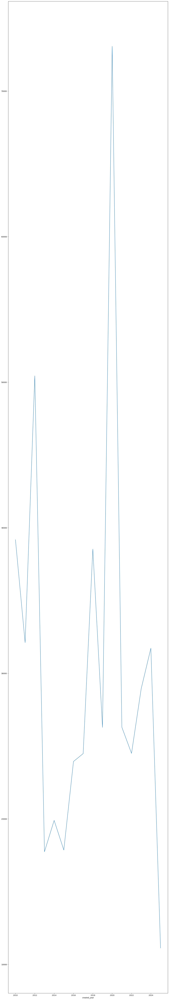

In [25]:
df['created_year'].value_counts().sort_index().plot()

In [26]:
df.groupby('borough').size().sort_values(ascending=False)

borough
QUEENS           211153
BROOKLYN         146214
STATEN ISLAND     56740
BRONX             43199
MANHATTAN         24669
Unspecified        4129
dtype: int64

In [27]:
pd.set_option('display.max_rows', None)

In [124]:
df.groupby(['borough','created_year']).size().reset_index()

,borough,created_year,0
0,BRONX,2010,3464
1,BRONX,2011,3074
2,BRONX,2012,3445
3,BRONX,2013,1439
4,BRONX,2014,1619
5,BRONX,2015,1422
6,BRONX,2016,2363
7,BRONX,2017,2502
8,BRONX,2018,3683
9,BRONX,2019,2368


In [125]:
import matplotlib.pyplot as plt

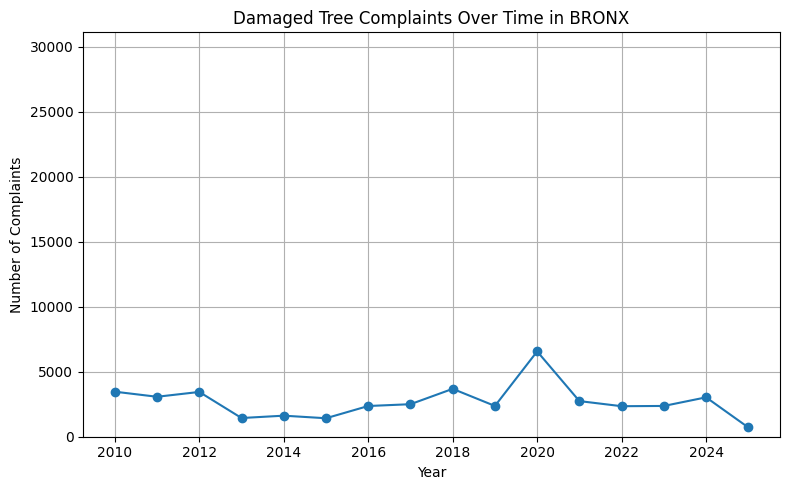

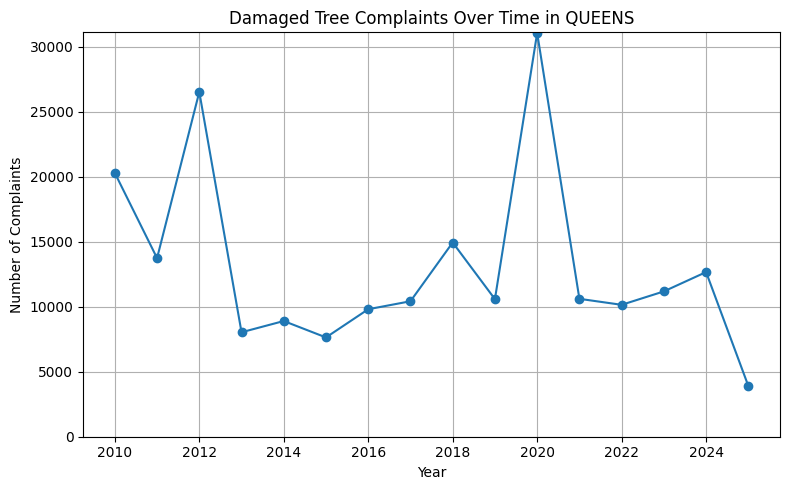

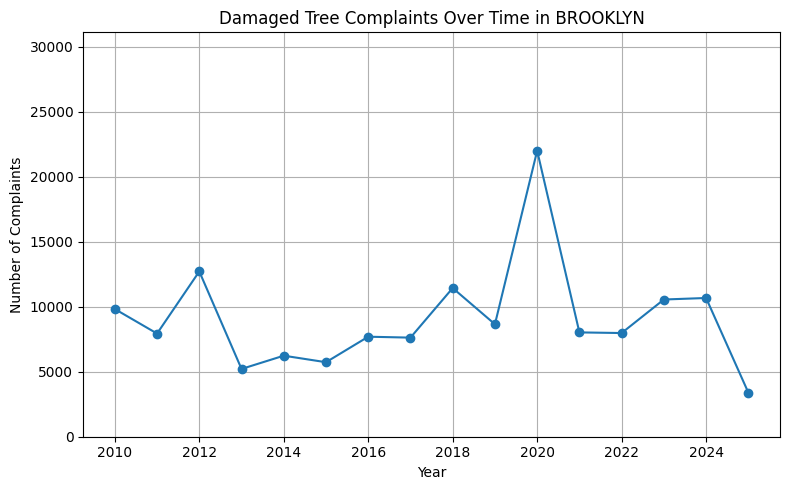

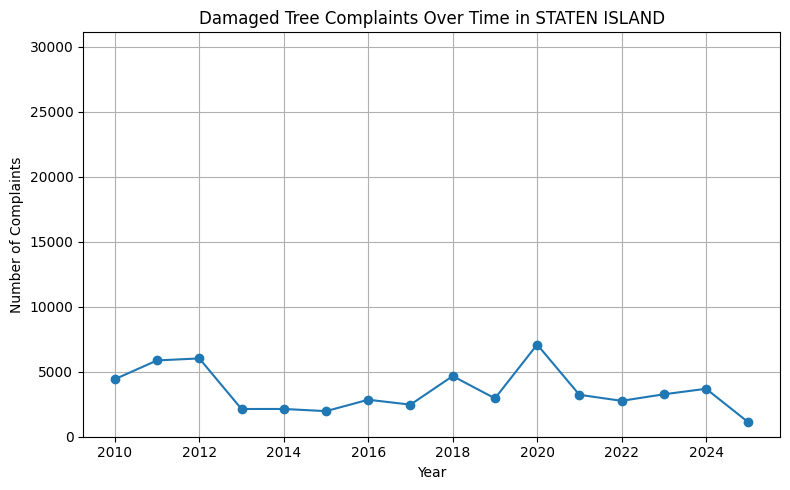

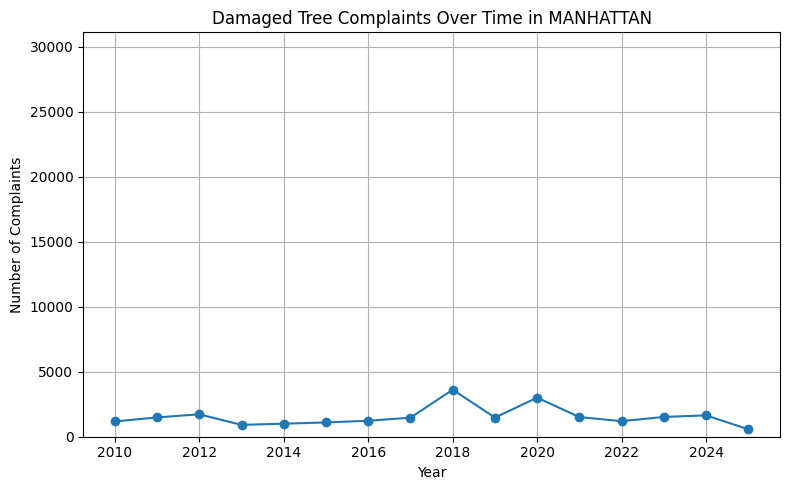

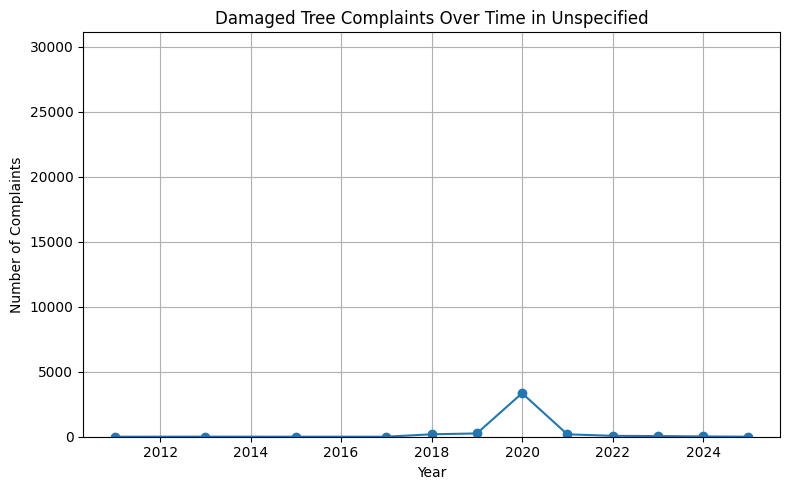

In [128]:
# Make sure 'grouped' has the correct structure
grouped = df.groupby(['borough', 'created_year']).size().reset_index(name='count')

# Get max count to standardize y-axis
max_count = grouped['count'].max()

# Optional: sort years numerically for proper plotting
grouped['created_year'] = grouped['created_year'].astype(int)
grouped = grouped.sort_values('created_year')

for borough in grouped['borough'].dropna().unique():
    borough_data = grouped[grouped['borough'] == borough]

    plt.figure(figsize=(8, 5))
    plt.plot(borough_data['created_year'], borough_data['count'], marker='o')
    plt.title(f"Damaged Tree Complaints Over Time in {borough}")
    plt.xlabel("Year")
    plt.ylabel("Number of Complaints")
    plt.ylim(0, max_count + 50)  # Keep all plots on the same scale
    plt.grid(True)
    plt.tight_layout()
    plt.show()


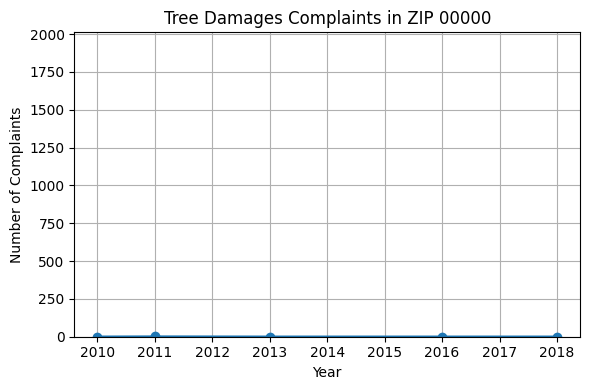

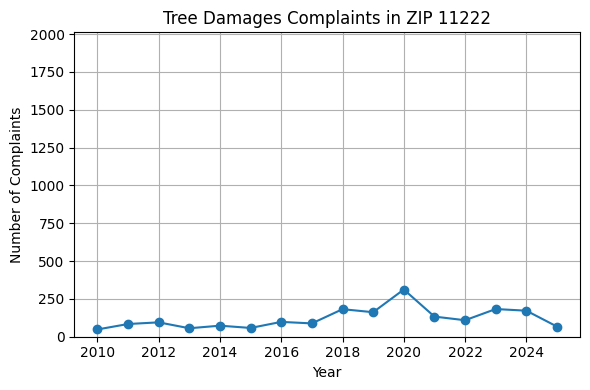

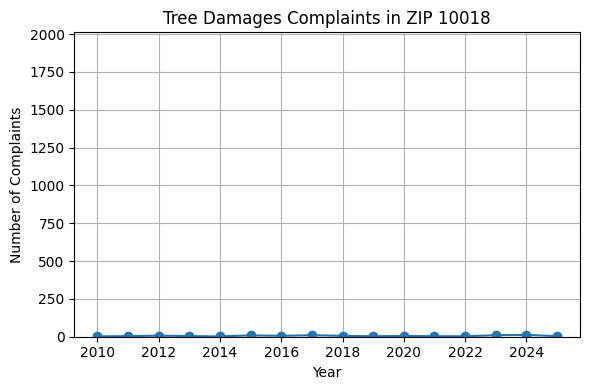

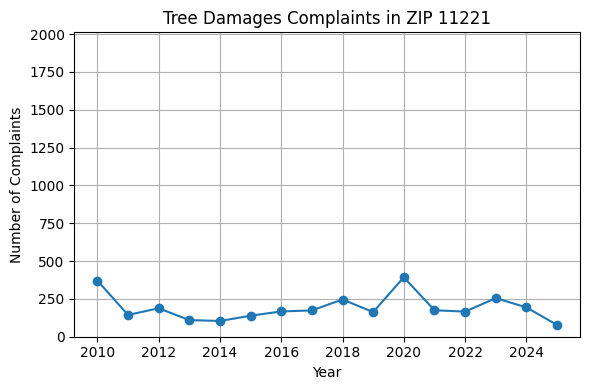

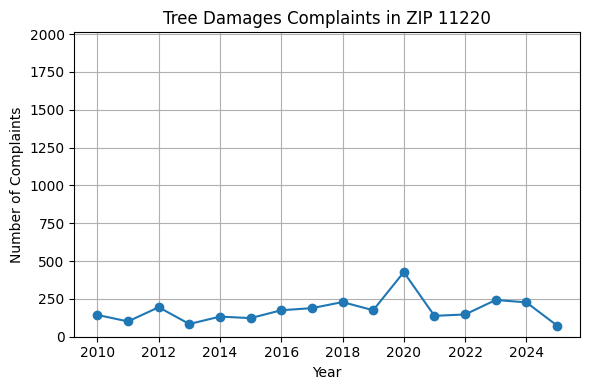

...

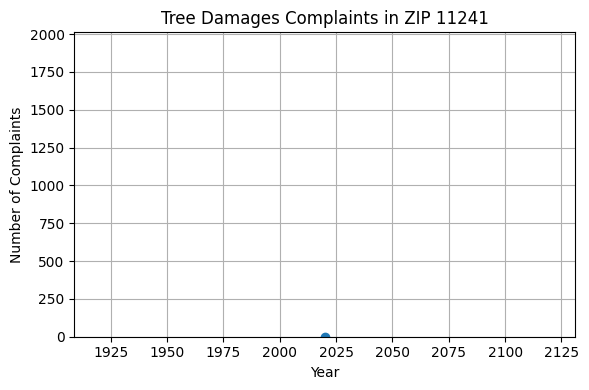

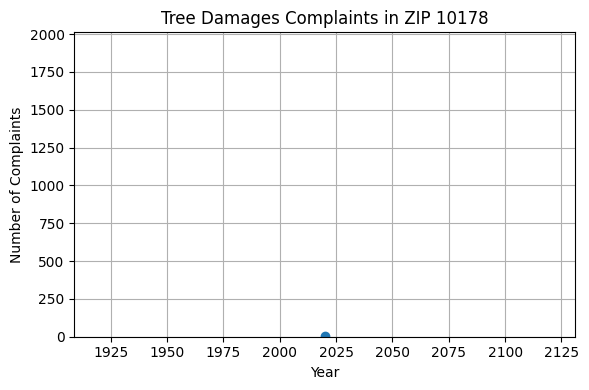

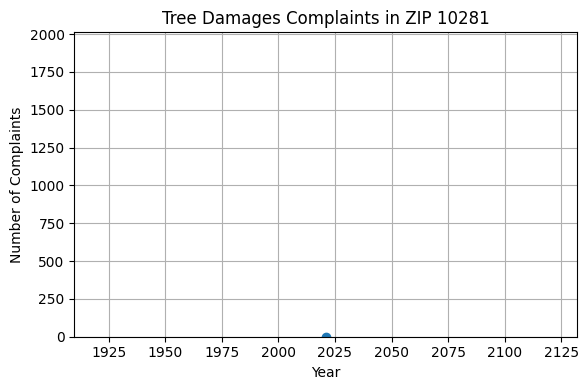

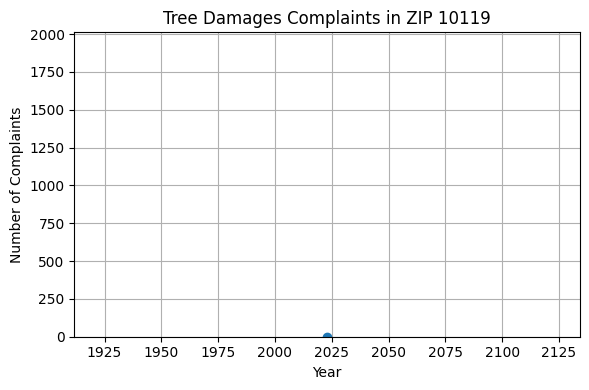

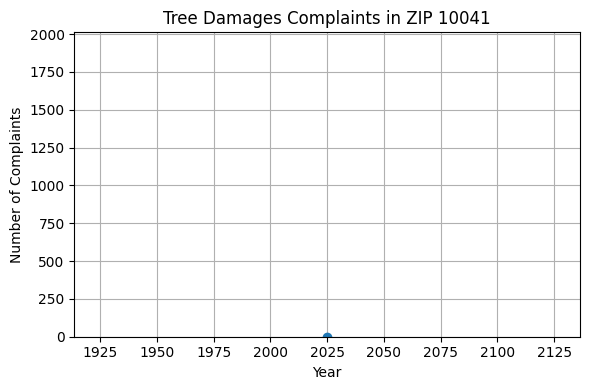

In [248]:
# Group by incident_zip and created_year
grouped = df.groupby(['incident_zip', 'created_year']).size().reset_index(name='count')

# Convert year to int and sort for proper plotting
grouped['created_year'] = grouped['created_year'].astype(int)
grouped = grouped.sort_values('created_year')

# Get max count to standardize y-axis across all plots
max_count = grouped['count'].max()

# Loop through unique ZIP codes and plot smaller charts
for zip_code in grouped['incident_zip'].dropna().unique():
    zip_data = grouped[grouped['incident_zip'] == zip_code]

    plt.figure(figsize=(6, 4))  # Smaller figure size
    plt.plot(zip_data['created_year'], zip_data['count'], marker='o')
    plt.title(f"Tree Damages Complaints in ZIP {zip_code}")
    plt.xlabel("Year")
    plt.ylabel("Number of Complaints")
    plt.ylim(0, max_count + 10)  # Consistent y-axis, slight padding
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# New Tree Requests

In [133]:
import requests

url = "https://data.cityofnewyork.us/resource/erm2-nwe9.json?$select=distinct complaint_type&$where=complaint_type like '%Tree%'"
response = requests.get(url)
print(response.json())

[{'complaint_type': 'Illegal Tree Damage'}, {'complaint_type': 'Request Xmas Tree Collection'}, {'complaint_type': 'Damaged Tree'}, {'complaint_type': 'Dead/Dying Tree'}, {'complaint_type': 'New Tree Request'}, {'complaint_type': 'Dead Tree'}, {'complaint_type': 'Overgrown Tree/Branches'}]


In [129]:
import time

In [134]:
# Base URL and parameters
base_url = "https://data.cityofnewyork.us/resource/erm2-nwe9.json"
complaint_type = "New Tree Request"
limit = 1000
offset = 0

all_records = []

while True:
    params = {
        "$where": f"complaint_type='{complaint_type}'",
        "$order": "created_date DESC",
        "$limit": limit,
        "$offset": offset
    }

    response = requests.get(base_url, params=params)

    if response.status_code != 200:
        print(f"Failed request at offset {offset}. Status code: {response.status_code}")
        break

    data = response.json()
    if not data:
        print("No more records to fetch.")
        break

    all_records.extend(data)
    print(f"Fetched {len(data)} records; total so far: {len(all_records)}")

    offset += limit
    time.sleep(1)  # Be polite to the API

# Convert to DataFrame
df_planting = pd.DataFrame(all_records)

# Show basic info
print(f"\nTotal records fetched: {len(df_planting)}")

Fetched 1000 records; total so far: 1000
Fetched 1000 records; total so far: 2000
Fetched 1000 records; total so far: 3000
Fetched 1000 records; total so far: 4000
Fetched 1000 records; total so far: 5000
Fetched 1000 records; total so far: 6000
Fetched 1000 records; total so far: 7000
Fetched 1000 records; total so far: 8000
Fetched 1000 records; total so far: 9000
Fetched 1000 records; total so far: 10000
Fetched 1000 records; total so far: 11000
Fetched 1000 records; total so far: 12000
Fetched 1000 records; total so far: 13000
Fetched 1000 records; total so far: 14000
Fetched 1000 records; total so far: 15000
Fetched 1000 records; total so far: 16000
Fetched 1000 records; total so far: 17000
Fetched 1000 records; total so far: 18000
Fetched 1000 records; total so far: 19000
Fetched 1000 records; total so far: 20000
Fetched 1000 records; total so far: 21000
Fetched 1000 records; total so far: 22000
Fetched 1000 records; total so far: 23000
Fetched 1000 records; total so far: 24000
F

In [136]:
df_planting.head()

,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,street_name,cross_street_1,cross_street_2,intersection_street_1,intersection_street_2,address_type,city,landmark,status,community_board,bbl,borough,x_coordinate_state_plane,y_coordinate_state_plane,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,closed_date,resolution_description,resolution_action_updated_date,due_date,facility_type
0,65256336,2025-06-13T10:27:43.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11230,1143 EAST 13 STREET,EAST 13 STREET,AVENUE K,AVENUE L,AVENUE K,AVENUE L,ADDRESS,BROOKLYN,EAST 13 STREET,In Progress,14 BROOKLYN,3067240069,BROOKLYN,994638,165712,PHONE,Unspecified,BROOKLYN,40.621511544866365,-73.96258022976183,"{'latitude': '40.621511544866365', 'longitude'...",NaN,NaN,NaN,NaN,NaN
1,65251174,2025-06-12T16:43:14.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11234,1548 EAST 46 STREET,EAST 46 STREET,AVENUE L,AVENUE M,AVENUE L,AVENUE M,ADDRESS,BROOKLYN,EAST 46 STREET,Closed,18 BROOKLYN,3078430051,BROOKLYN,1003353,166111,PHONE,Unspecified,BROOKLYN,40.62259221132799,-73.93118583978557,"{'latitude': '40.62259221132799', 'longitude':...",2025-06-13T05:46:04.000,In an effort to more fully and efficiently ser...,2025-06-13T05:46:07.000,NaN,NaN
2,65248682,2025-06-12T10:41:24.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11004,80-60 259 STREET,259 STREET,80 AVENUE,81 AVENUE,80 AVENUE,81 AVENUE,ADDRESS,GLEN OAKS,259 STREET,Closed,13 QUEENS,4087140008,QUEENS,1064159,210312,ONLINE,Unspecified,QUEENS,40.74357342918911,-73.71162302448688,"{'latitude': '40.74357342918911', 'longitude':...",2025-06-13T05:46:04.000,In an effort to more fully and efficiently ser...,2025-06-13T05:46:07.000,NaN,NaN
3,65239728,2025-06-11T17:57:07.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11433,92-38 176 STREET,176 STREET,JAMAICA AVENUE,93 AVENUE,JAMAICA AVENUE,93 AVENUE,ADDRESS,JAMAICA,176 STREET,Closed,12 QUEENS,4102150021,QUEENS,1043978,197055,PHONE,Unspecified,QUEENS,40.707345622833124,-73.78456988045782,"{'latitude': '40.707345622833124', 'longitude'...",2025-06-12T06:02:33.000,In an effort to more fully and efficiently ser...,2025-06-12T06:02:36.000,NaN,NaN
4,65233904,2025-06-11T17:21:31.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,10023,106 WEST 69 STREET,WEST 69 STREET,COLUMBUS AVENUE,BROADWAY,COLUMBUS AVENUE,BROADWAY,ADDRESS,NEW YORK,WEST 69 STREET,Closed,07 MANHATTAN,1011400133,MANHATTAN,989621,221864,ONLINE,Unspecified,MANHATTAN,40.77564010372952,-73.98060774383835,"{'latitude': '40.77564010372952', 'longitude':...",2025-06-12T05:59:07.000,In an effort to more fully and efficiently ser...,2025-06-12T05:59:10.000,NaN,NaN


In [137]:
df_planting.shape

(248188, 34)

In [139]:
df_planting['created_year'] = df_planting['created_date'].str.extract(r'(\d{4})')

In [140]:
df_planting['created_year'].value_counts().sort_index()

created_year
2010     9859
2011     9849
2012     9344
2013    19251
2014    17982
2015    15096
2016    18337
2017    17012
2018    20695
2019    17463
2020    14096
2021    15865
2022    19517
2023    22428
2024    21010
2025      384
Name: count, dtype: int64

<Axes: xlabel='created_year'>

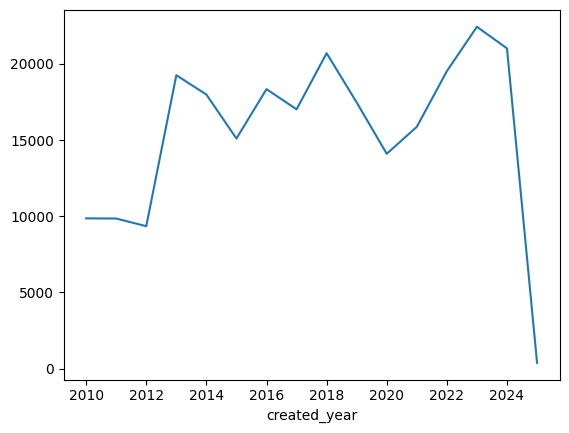

In [141]:
df_planting['created_year'].value_counts().sort_index().plot()

In [142]:
df_planting.groupby('borough').size().sort_values(ascending=False)

borough
BROOKLYN         100808
QUEENS            64952
MANHATTAN         46636
BRONX             19196
STATEN ISLAND     15335
Unspecified        1261
dtype: int64

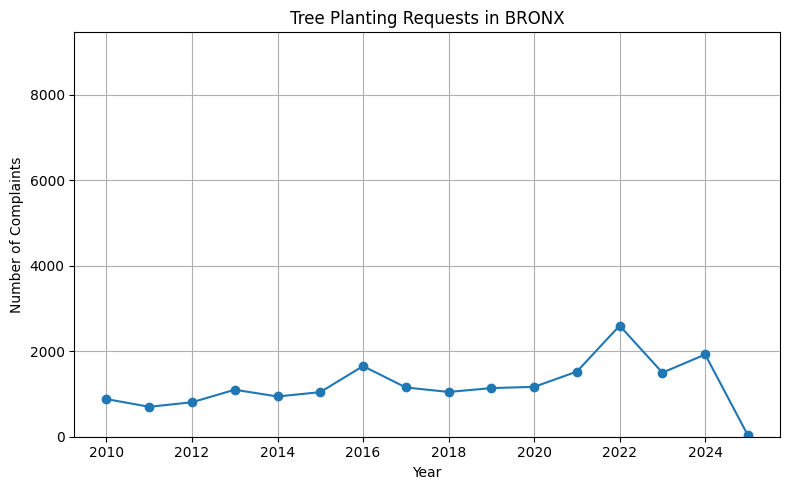

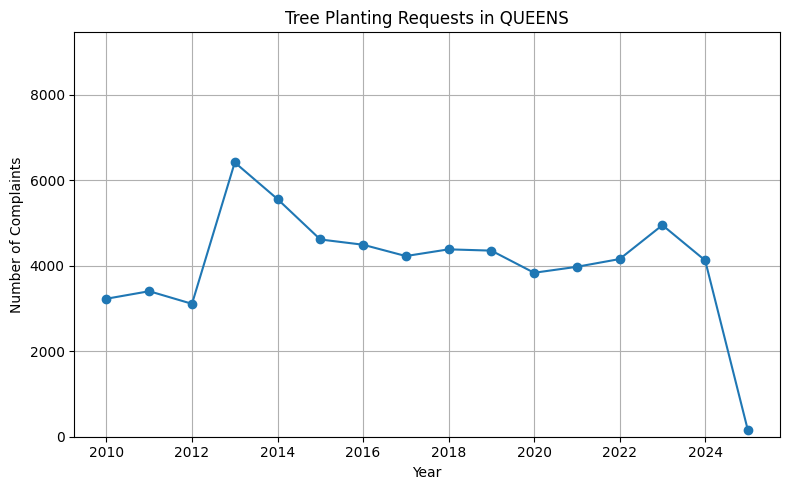

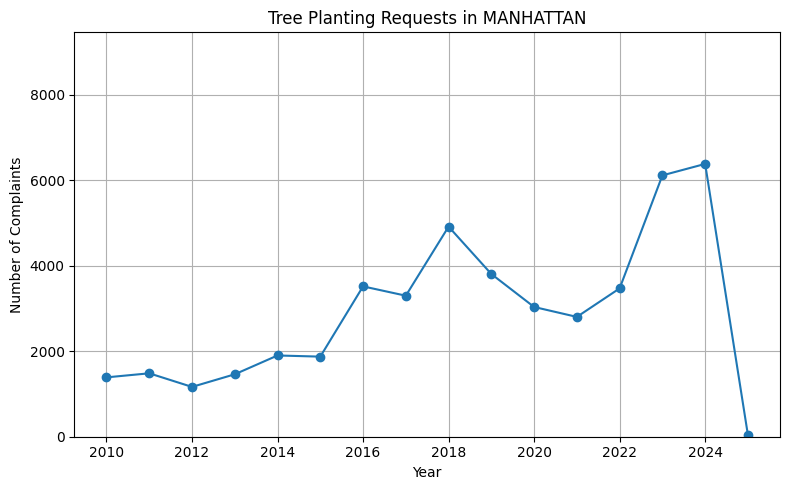

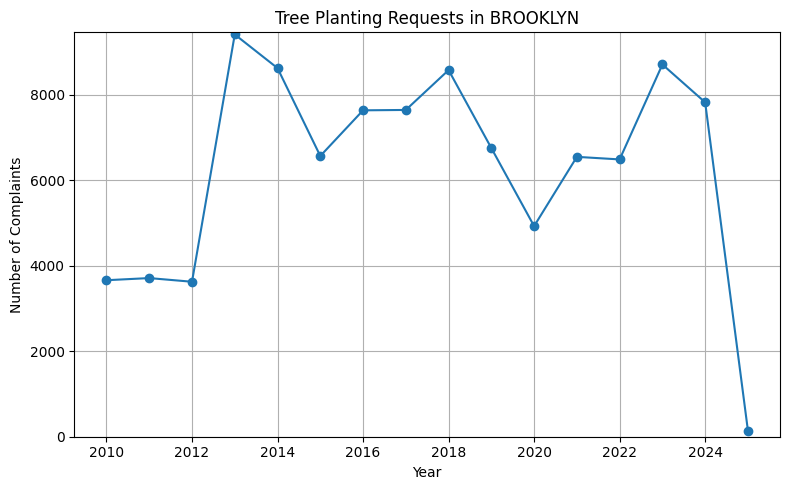

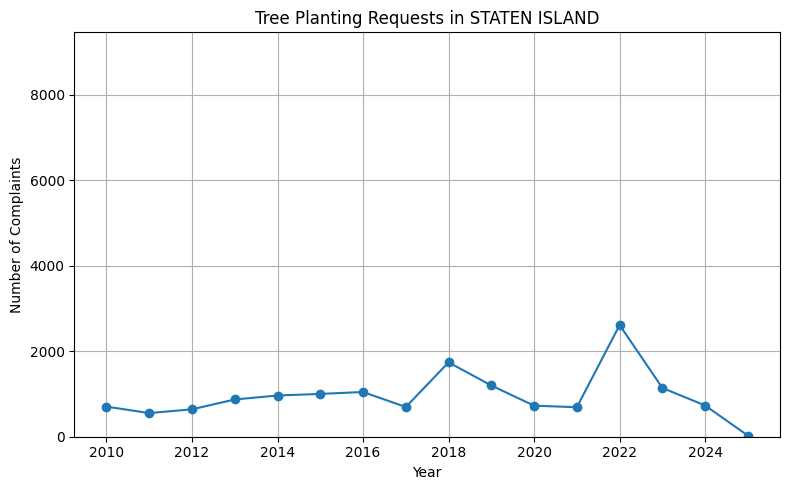

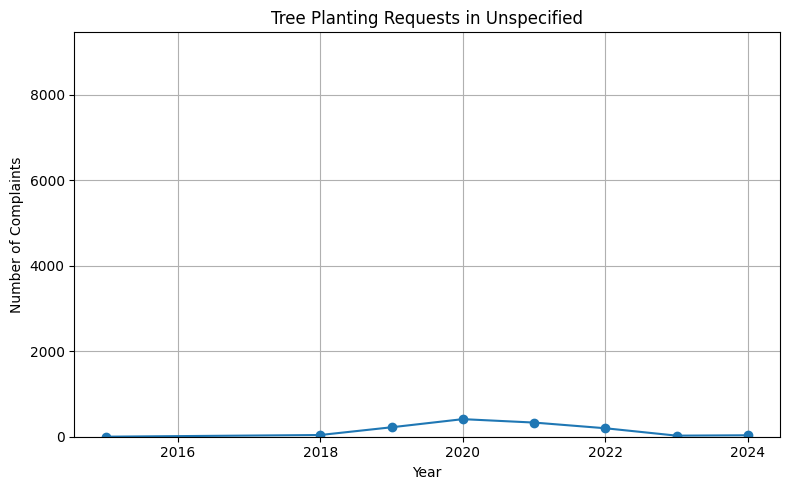

In [210]:
# Make sure 'grouped' has the correct structure
grouped = df_planting.groupby(['borough', 'created_year']).size().reset_index(name='count')

# Get max count to standardize y-axis
max_count = grouped['count'].max()

# Optional: sort years numerically for proper plotting
grouped['created_year'] = grouped['created_year'].astype(int)
grouped = grouped.sort_values('created_year')

for borough in grouped['borough'].dropna().unique():
    borough_data = grouped[grouped['borough'] == borough]

    plt.figure(figsize=(8, 5))
    plt.plot(borough_data['created_year'], borough_data['count'], marker='o')
    plt.title(f"Tree Planting Requests in {borough}")
    plt.xlabel("Year")
    plt.ylabel("Number of Complaints")
    plt.ylim(0, max_count + 50)  # Keep all plots on the same scale
    plt.grid(True)
    plt.tight_layout()
    plt.show()

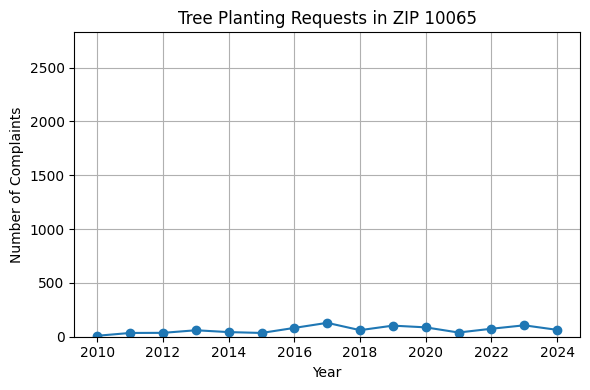

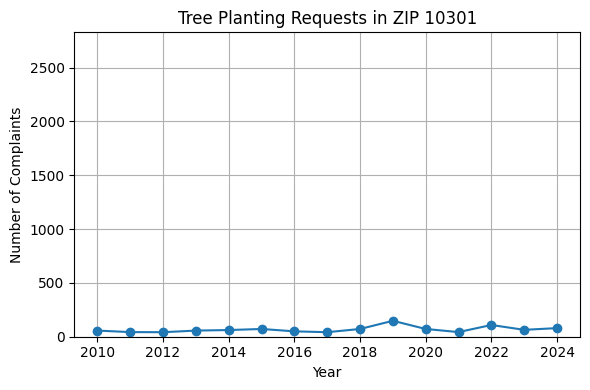

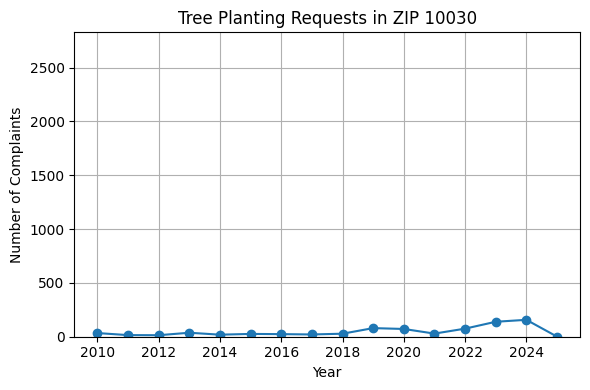

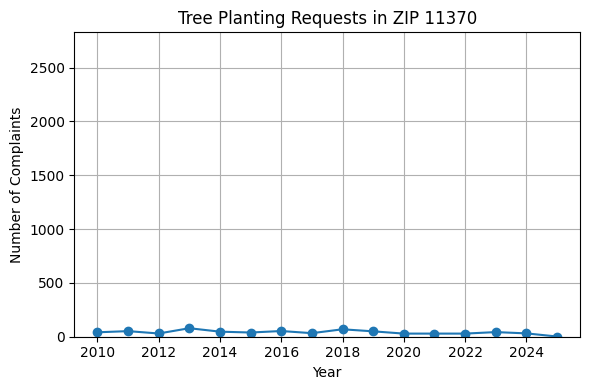

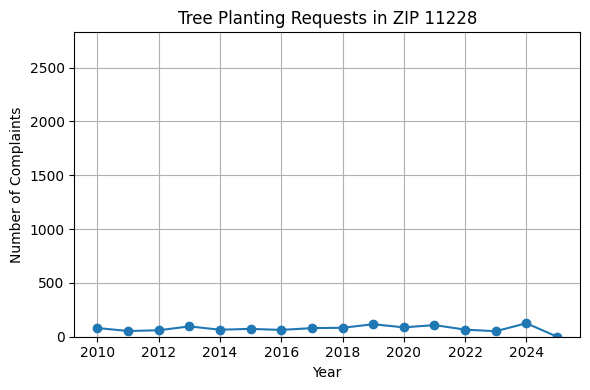

...

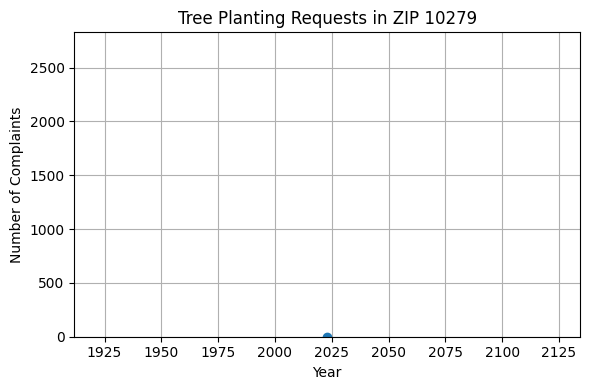

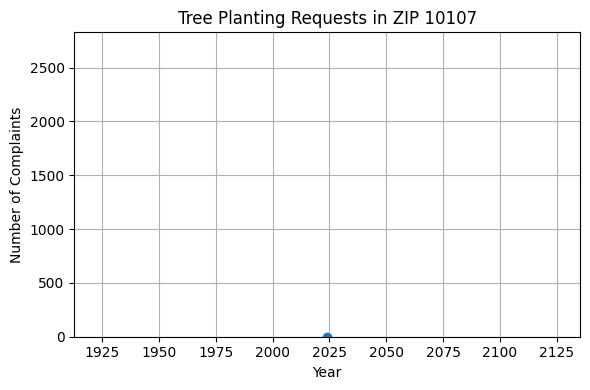

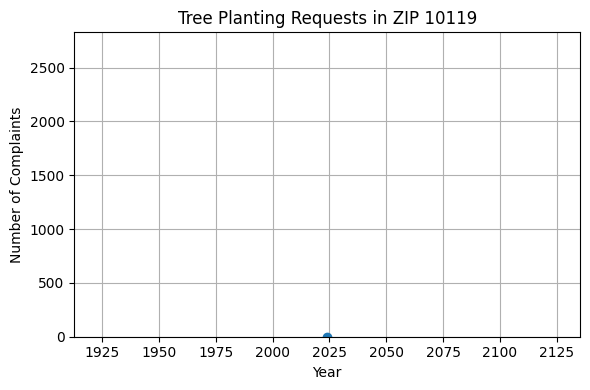

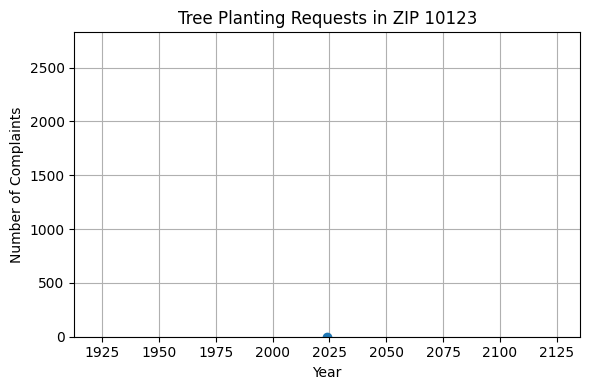

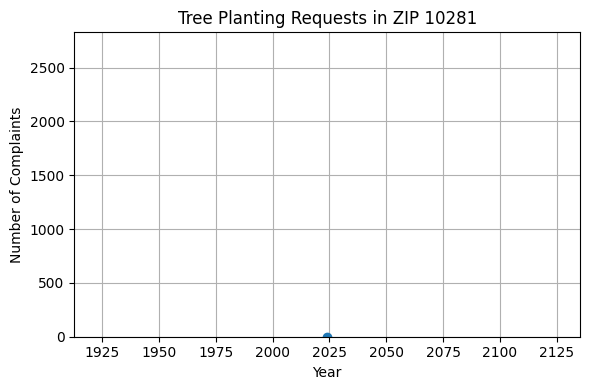

In [247]:
# Group by incident_zip and created_year
grouped = df_planting.groupby(['incident_zip', 'created_year']).size().reset_index(name='count')

# Convert year to int and sort for proper plotting
grouped['created_year'] = grouped['created_year'].astype(int)
grouped = grouped.sort_values('created_year')

# Get max count to standardize y-axis across all plots
max_count = grouped['count'].max()

# Loop through unique ZIP codes and plot smaller charts
for zip_code in grouped['incident_zip'].dropna().unique():
    zip_data = grouped[grouped['incident_zip'] == zip_code]

    plt.figure(figsize=(6, 4))  # Smaller figure size
    plt.plot(zip_data['created_year'], zip_data['count'], marker='o')
    plt.title(f"Tree Planting Requests in ZIP {zip_code}")
    plt.xlabel("Year")
    plt.ylabel("Number of Complaints")
    plt.ylim(0, max_count + 10)  # Consistent y-axis, slight padding
    plt.grid(True)
    plt.tight_layout()
    plt.show()

## Reading in zip code population data from the US Census (ACS 2023 5-year survey)

In [143]:
pop = pd.read_csv('acs2023_5yr_B01003_86000US10010.csv')

In [144]:
pop.head()

,geoid,name,B01003001,"B01003001, Error"
0,16000US3651000,"New York, NY",8516202,NaN
1,86000US07002,07002,70468,48.0
2,86000US07008,07008,25220,91.0
3,86000US07020,07020,14544,21.0
4,86000US07024,07024,39785,63.0


## Merging in zip code population data with 311 tree planting requests data

In [145]:
plant_pop = df_planting.merge(pop, left_on='incident_zip', right_on='name', how='left')

In [146]:
plant_pop.head()

,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,street_name,cross_street_1,cross_street_2,intersection_street_1,intersection_street_2,address_type,city,landmark,status,community_board,bbl,borough,x_coordinate_state_plane,y_coordinate_state_plane,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,closed_date,resolution_description,resolution_action_updated_date,due_date,facility_type,created_year,geoid,name,B01003001,"B01003001, Error"
0,65256336,2025-06-13T10:27:43.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11230,1143 EAST 13 STREET,EAST 13 STREET,AVENUE K,AVENUE L,AVENUE K,AVENUE L,ADDRESS,BROOKLYN,EAST 13 STREET,In Progress,14 BROOKLYN,3067240069,BROOKLYN,994638,165712,PHONE,Unspecified,BROOKLYN,40.621511544866365,-73.96258022976183,"{'latitude': '40.621511544866365', 'longitude'...",NaN,NaN,NaN,NaN,NaN,2025,86000US11230,11230,88252.0,2692.0
1,65251174,2025-06-12T16:43:14.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11234,1548 EAST 46 STREET,EAST 46 STREET,AVENUE L,AVENUE M,AVENUE L,AVENUE M,ADDRESS,BROOKLYN,EAST 46 STREET,Closed,18 BROOKLYN,3078430051,BROOKLYN,1003353,166111,PHONE,Unspecified,BROOKLYN,40.62259221132799,-73.93118583978557,"{'latitude': '40.62259221132799', 'longitude':...",2025-06-13T05:46:04.000,In an effort to more fully and efficiently ser...,2025-06-13T05:46:07.000,NaN,NaN,2025,86000US11234,11234,87778.0,2394.0
2,65248682,2025-06-12T10:41:24.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11004,80-60 259 STREET,259 STREET,80 AVENUE,81 AVENUE,80 AVENUE,81 AVENUE,ADDRESS,GLEN OAKS,259 STREET,Closed,13 QUEENS,4087140008,QUEENS,1064159,210312,ONLINE,Unspecified,QUEENS,40.74357342918911,-73.71162302448688,"{'latitude': '40.74357342918911', 'longitude':...",2025-06-13T05:46:04.000,In an effort to more fully and efficiently ser...,2025-06-13T05:46:07.000,NaN,NaN,2025,86000US11004,11004,14296.0,1665.0
3,65239728,2025-06-11T17:57:07.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11433,92-38 176 STREET,176 STREET,JAMAICA AVENUE,93 AVENUE,JAMAICA AVENUE,93 AVENUE,ADDRESS,JAMAICA,176 STREET,Closed,12 QUEENS,4102150021,QUEENS,1043978,197055,PHONE,Unspecified,QUEENS,40.707345622833124,-73.78456988045782,"{'latitude': '40.707345622833124', 'longitude'...",2025-06-12T06:02:33.000,In an effort to more fully and efficiently ser...,2025-06-12T06:02:36.000,NaN,NaN,2025,86000US11433,11433,37777.0,2566.0
4,65233904,2025-06-11T17:21:31.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,10023,106 WEST 69 STREET,WEST 69 STREET,COLUMBUS AVENUE,BROADWAY,COLUMBUS AVENUE,BROADWAY,ADDRESS,NEW YORK,WEST 69 STREET,Closed,07 MANHATTAN,1011400133,MANHATTAN,989621,221864,ONLINE,Unspecified,MANHATTAN,40.77564010372952,-73.98060774383835,"{'latitude': '40.77564010372952', 'longitude':...",2025-06-12T05:59:07.000,In an effort to more fully and efficiently ser...,2025-06-12T05:59:10.000,NaN,NaN,2025,86000US10023,10023,67468.0,3113.0


In [147]:
plant_pop['population'] = plant_pop['B01003001']

In [148]:
plant_pop = plant_pop.drop(columns={'B01003001','B01003001, Error'})

In [150]:
plant_pop.head()

,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,street_name,cross_street_1,cross_street_2,intersection_street_1,intersection_street_2,address_type,city,landmark,status,community_board,bbl,borough,x_coordinate_state_plane,y_coordinate_state_plane,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,closed_date,resolution_description,resolution_action_updated_date,due_date,facility_type,created_year,geoid,name,population
0,65256336,2025-06-13T10:27:43.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11230,1143 EAST 13 STREET,EAST 13 STREET,AVENUE K,AVENUE L,AVENUE K,AVENUE L,ADDRESS,BROOKLYN,EAST 13 STREET,In Progress,14 BROOKLYN,3067240069,BROOKLYN,994638,165712,PHONE,Unspecified,BROOKLYN,40.621511544866365,-73.96258022976183,"{'latitude': '40.621511544866365', 'longitude'...",NaN,NaN,NaN,NaN,NaN,2025,86000US11230,11230,88252.0
1,65251174,2025-06-12T16:43:14.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11234,1548 EAST 46 STREET,EAST 46 STREET,AVENUE L,AVENUE M,AVENUE L,AVENUE M,ADDRESS,BROOKLYN,EAST 46 STREET,Closed,18 BROOKLYN,3078430051,BROOKLYN,1003353,166111,PHONE,Unspecified,BROOKLYN,40.62259221132799,-73.93118583978557,"{'latitude': '40.62259221132799', 'longitude':...",2025-06-13T05:46:04.000,In an effort to more fully and efficiently ser...,2025-06-13T05:46:07.000,NaN,NaN,2025,86000US11234,11234,87778.0
2,65248682,2025-06-12T10:41:24.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11004,80-60 259 STREET,259 STREET,80 AVENUE,81 AVENUE,80 AVENUE,81 AVENUE,ADDRESS,GLEN OAKS,259 STREET,Closed,13 QUEENS,4087140008,QUEENS,1064159,210312,ONLINE,Unspecified,QUEENS,40.74357342918911,-73.71162302448688,"{'latitude': '40.74357342918911', 'longitude':...",2025-06-13T05:46:04.000,In an effort to more fully and efficiently ser...,2025-06-13T05:46:07.000,NaN,NaN,2025,86000US11004,11004,14296.0
3,65239728,2025-06-11T17:57:07.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11433,92-38 176 STREET,176 STREET,JAMAICA AVENUE,93 AVENUE,JAMAICA AVENUE,93 AVENUE,ADDRESS,JAMAICA,176 STREET,Closed,12 QUEENS,4102150021,QUEENS,1043978,197055,PHONE,Unspecified,QUEENS,40.707345622833124,-73.78456988045782,"{'latitude': '40.707345622833124', 'longitude'...",2025-06-12T06:02:33.000,In an effort to more fully and efficiently ser...,2025-06-12T06:02:36.000,NaN,NaN,2025,86000US11433,11433,37777.0
4,65233904,2025-06-11T17:21:31.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,10023,106 WEST 69 STREET,WEST 69 STREET,COLUMBUS AVENUE,BROADWAY,COLUMBUS AVENUE,BROADWAY,ADDRESS,NEW YORK,WEST 69 STREET,Closed,07 MANHATTAN,1011400133,MANHATTAN,989621,221864,ONLINE,Unspecified,MANHATTAN,40.77564010372952,-73.98060774383835,"{'latitude': '40.77564010372952', 'longitude':...",2025-06-12T05:59:07.000,In an effort to more fully and efficiently ser...,2025-06-12T05:59:10.000,NaN,NaN,2025,86000US10023,10023,67468.0


In [151]:
plant_pop['descriptor'].value_counts()

descriptor
For One Address    246535
For Whole Block      1653
Name: count, dtype: int64

In [224]:
# First, group by ZIP and aggregate both count and population
zip_stats = plant_pop.groupby('incident_zip').agg({
    'unique_key': 'count',  # or any column that's always filled
    'population': 'first'   # assuming population is constant per ZIP
}).rename(columns={'unique_key': 'complaint_count'})

In [225]:
# Now calculate complaints per 1000 people
zip_stats['complaints_per_1000'] = zip_stats['complaint_count'] / zip_stats['population'] * 1000

In [226]:
zip_stats.head()

,complaint_count,population,complaints_per_1000
incident_zip,,,
00083,2,NaN,NaN
10000,1,NaN,NaN
10001,883,29079.0,30.365556
10002,1629,75517.0,21.571302
10003,2590,53825.0,48.118904


In [227]:
zip_stats.sort_values(by='complaints_per_1000', ascending=False).head(50)

,complaint_count,population,complaints_per_1000
incident_zip,,,
10177,1,0.0,inf
10173,3,0.0,inf
10111,1,0.0,inf
10110,4,0.0,inf
10153,1,0.0,inf
10154,1,0.0,inf
10278,2,0.0,inf
10167,2,0.0,inf
10169,2,0.0,inf


In [228]:
zip_stats.shape

(213, 3)

In [229]:
zip_stats.to_csv('zip_tree_plant_requests.aggregates.csv')

## Mapping the data on a zip codes map from census

In [163]:
from dotenv import load_dotenv
load_dotenv() # <- searches for a file named .env and loads the environment variables in it

True

In [164]:
%%R 

census_api_key(Sys.getenv("CENSUS_API_KEY")) # <- Loads CENSUS_API_KEY from environment variable and sets it in R

To install your API key for use in future sessions, run this function with `install = TRUE`.


In [170]:
%%R

library(tigris)

To enable caching of data, set `options(tigris_use_cache = TRUE)`
in your R script or .Rprofile.


In [172]:
%%R

# Get ZCTA geometries (defaults to most recent year with data)
zctas <- zctas(year = 2020)  # 2020 is latest full TIGER release for ZCTAs

  |======================================================================| 100%


In [177]:
%%R

nyc_zip_list <- c(
  "10001", "10002", "10003", "10004", "10005", "10006", "10007", "10009", "10010", 
  "10011", "10012", "10013", "10014", "10016", "10017", "10018", "10019", "10020",
  "10021", "10022", "10023", "10024", "10025", "10026", "10027", "10028", "10029", 
  "10030", "10031", "10032", "10033", "10034", "10035", "10036", "10037", "10038", 
  "10039", "10040", "10044", "10065", "10069", "10075", "10128", "10280", "10282",
  "10301", "10302", "10303", "10304", "10305", "10306", "10307", "10308", "10309",
  "10310", "10312", "10314",
  "10451", "10452", "10453", "10454", "10455", "10456", "10457", "10458", "10459",
  "10460", "10461", "10462", "10463", "10464", "10465", "10466", "10467", "10468",
  "10469", "10470", "10471", "10472", "10473", "10474", "10475",
  "11001", "11004", "11005", "11101", "11102", "11103", "11104", "11105", "11106",
  "11354", "11355", "11356", "11357", "11358", "11359", "11360", "11361", "11362",
  "11363", "11364", "11365", "11366", "11367", "11368", "11369", "11370", "11371",
  "11372", "11373", "11374", "11375", "11377", "11378", "11379", "11385",
  "11411", "11412", "11413", "11414", "11415", "11416", "11417", "11418", "11419",
  "11420", "11421", "11422", "11423", "11426", "11427", "11428", "11429", "11430",
  "11432", "11433", "11434", "11435", "11436",
  "11691", "11692", "11693", "11694", "11695", "11697"
)

In [178]:
%%R

ny_zips <- zctas[zctas$GEOID %in% nyc_zip_list, ]

In [179]:
%%R

head(ny_zips)

Simple feature collection with 6 features and 9 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: -74.21316 ymin: 40.51928 xmax: -73.72479 ymax: 40.80101
Geodetic CRS:  NAD83
     ZCTA5CE20 GEOID20 CLASSFP20 MTFCC20 FUNCSTAT20  ALAND20 AWATER20
9052     11363   11363        B5   G6350          S  2239195    34217
9053     11422   11422        B5   G6350          S  5436200   137648
9339     10005   10005        B5   G6350          S   188727        0
9342     10312   10312        B5   G6350          S 17797576   137541
9421     11357   11357        B5   G6350          S  7341415     2281
9422     11413   11413        B5   G6350          S  7812635    43490
      INTPTLAT20   INTPTLON20                       geometry
9052 +40.7723479 -073.7462919 MULTIPOLYGON (((-73.75557 4...
9053 +40.6607865 -073.7375702 MULTIPOLYGON (((-73.75202 4...
9339 +40.7062151 -074.0086868 MULTIPOLYGON (((-74.01251 4...
9342 +40.5452374 -074.1804434 MULTIPOLYGON (((-74.21316 4...
9421 +

In [216]:
%%R

df <- read.csv('zip_tree_plant_requests.aggregates.csv')

In [217]:
%%R

head(df)

  incident_zip complaint_count population complaints_per_1000
1           83               2         NA                  NA
2        10000               1         NA                  NA
3        10001             883      29079            30.36556
4        10002            1629      75517            21.57130
5        10003            2590      53825            48.11890
6        10004              90       3875            23.22581


In [218]:
%%R

df$incident_zip <- as.character(df$incident_zip)
ny_zips$ZCTA5CE20 <- as.character(ny_zips$ZCTA5CE20)

In [219]:
%%R

merged_df_plant_requests <- merge(df, ny_zips, by.x = "incident_zip", by.y = "ZCTA5CE20", all = TRUE)

In [220]:
%%R

nrow(merged_df_plant_requests)

[1] 216


In [221]:
%%R

head(merged_df_plant_requests)

  incident_zip complaint_count population complaints_per_1000 GEOID20 CLASSFP20
1        10000               1         NA                  NA    <NA>      <NA>
2        10001             883      29079           30.365556   10001        B5
3        10002            1629      75517           21.571302   10002        B5
4        10003            2590      53825           48.118904   10003        B5
5        10004              90       3875           23.225806   10004        B5
6        10005              66       9238            7.144404   10005        B5
  MTFCC20 FUNCSTAT20 ALAND20 AWATER20  INTPTLAT20   INTPTLON20
1    <NA>       <NA>      NA       NA        <NA>         <NA>
2   G6350          S 1615692        0 +40.7506496 -073.9972929
3   G6350          S 2129728        0 +40.7159693 -073.9868946
4   G6350          S 1480445        0 +40.7318636 -073.9891252
5   G6350          S 1179938        0 +40.6898053 -074.0173890
6   G6350          S  188727        0 +40.7062151 -074.0086868

In [222]:
%%R

library(sf)
merged_df_plant_requests <- st_as_sf(merged_df_plant_requests)


 

(`geom_text()`). 



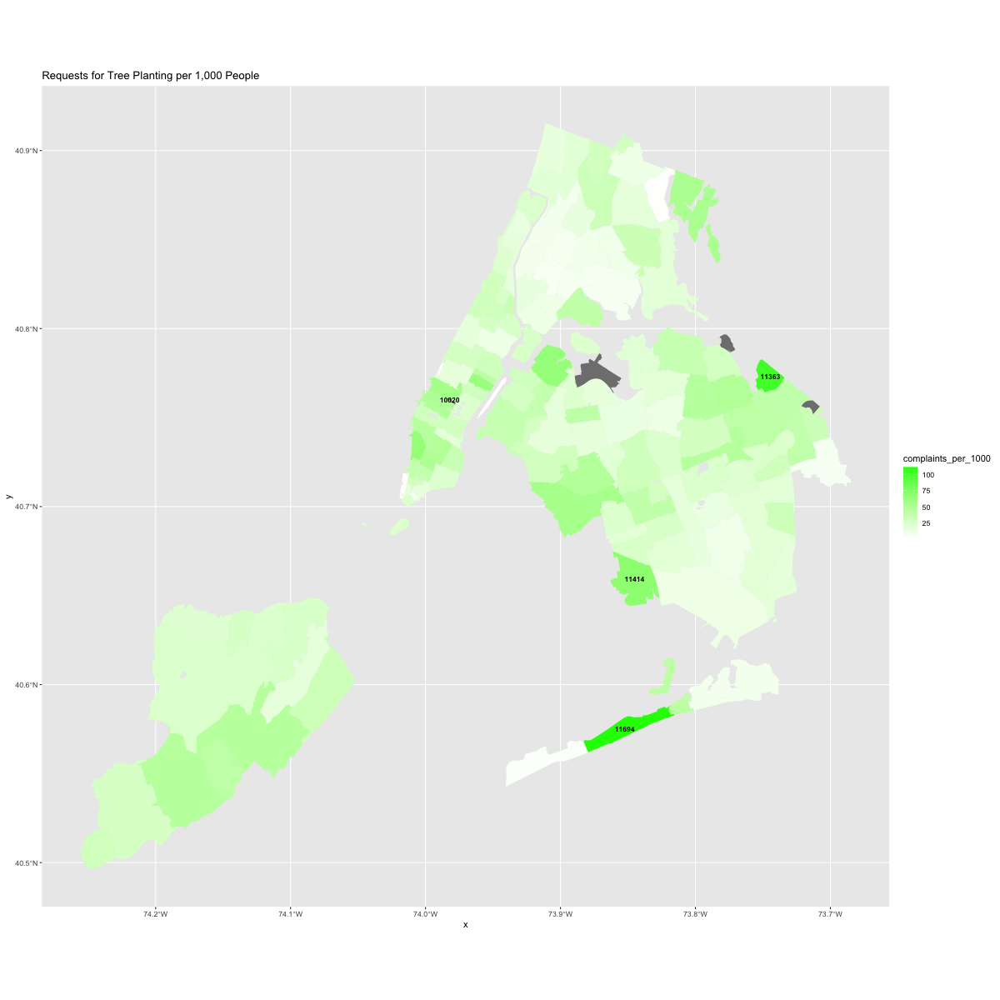

In [246]:
%%R -w 1200 -h 1200
# Identify top ZIP codes by complaints per 1,000
top_labels <- merged_df_plant_requests %>%
  arrange(desc(complaints_per_1000)) %>%
  slice_head(n = 20)  # or use a threshold like filter(complaints_per_1000 > X)

# Plot with labels
merged_df_plant_requests %>%
  ggplot(aes(fill = complaints_per_1000)) + 
  geom_sf(color = NA) + 
  geom_sf_text(
    data = top_labels,
    aes(label = incident_zip), 
    size = 3,
    color = "black",
    fontface = "bold"
  ) +
  scale_fill_gradient(low = "white", high = "green") + 
  labs(
    title = "Requests for Tree Planting per 1,000 People",
    #subtitle = "Median Income by Census Tract, New York City",
    #caption = "Source: US Census Bureau"
  )

In [232]:
plant_pop.head()

,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,street_name,cross_street_1,cross_street_2,intersection_street_1,intersection_street_2,address_type,city,landmark,status,community_board,bbl,borough,x_coordinate_state_plane,y_coordinate_state_plane,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,closed_date,resolution_description,resolution_action_updated_date,due_date,facility_type,created_year,geoid,name,population
0,65256336,2025-06-13T10:27:43.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11230,1143 EAST 13 STREET,EAST 13 STREET,AVENUE K,AVENUE L,AVENUE K,AVENUE L,ADDRESS,BROOKLYN,EAST 13 STREET,In Progress,14 BROOKLYN,3067240069,BROOKLYN,994638,165712,PHONE,Unspecified,BROOKLYN,40.621511544866365,-73.96258022976183,"{'latitude': '40.621511544866365', 'longitude'...",NaN,NaN,NaN,NaN,NaN,2025,86000US11230,11230,88252.0
1,65251174,2025-06-12T16:43:14.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11234,1548 EAST 46 STREET,EAST 46 STREET,AVENUE L,AVENUE M,AVENUE L,AVENUE M,ADDRESS,BROOKLYN,EAST 46 STREET,Closed,18 BROOKLYN,3078430051,BROOKLYN,1003353,166111,PHONE,Unspecified,BROOKLYN,40.62259221132799,-73.93118583978557,"{'latitude': '40.62259221132799', 'longitude':...",2025-06-13T05:46:04.000,In an effort to more fully and efficiently ser...,2025-06-13T05:46:07.000,NaN,NaN,2025,86000US11234,11234,87778.0
2,65248682,2025-06-12T10:41:24.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11004,80-60 259 STREET,259 STREET,80 AVENUE,81 AVENUE,80 AVENUE,81 AVENUE,ADDRESS,GLEN OAKS,259 STREET,Closed,13 QUEENS,4087140008,QUEENS,1064159,210312,ONLINE,Unspecified,QUEENS,40.74357342918911,-73.71162302448688,"{'latitude': '40.74357342918911', 'longitude':...",2025-06-13T05:46:04.000,In an effort to more fully and efficiently ser...,2025-06-13T05:46:07.000,NaN,NaN,2025,86000US11004,11004,14296.0
3,65239728,2025-06-11T17:57:07.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,11433,92-38 176 STREET,176 STREET,JAMAICA AVENUE,93 AVENUE,JAMAICA AVENUE,93 AVENUE,ADDRESS,JAMAICA,176 STREET,Closed,12 QUEENS,4102150021,QUEENS,1043978,197055,PHONE,Unspecified,QUEENS,40.707345622833124,-73.78456988045782,"{'latitude': '40.707345622833124', 'longitude'...",2025-06-12T06:02:33.000,In an effort to more fully and efficiently ser...,2025-06-12T06:02:36.000,NaN,NaN,2025,86000US11433,11433,37777.0
4,65233904,2025-06-11T17:21:31.000,DPR,Department of Parks and Recreation,New Tree Request,For One Address,Street,10023,106 WEST 69 STREET,WEST 69 STREET,COLUMBUS AVENUE,BROADWAY,COLUMBUS AVENUE,BROADWAY,ADDRESS,NEW YORK,WEST 69 STREET,Closed,07 MANHATTAN,1011400133,MANHATTAN,989621,221864,ONLINE,Unspecified,MANHATTAN,40.77564010372952,-73.98060774383835,"{'latitude': '40.77564010372952', 'longitude':...",2025-06-12T05:59:07.000,In an effort to more fully and efficiently ser...,2025-06-12T05:59:10.000,NaN,NaN,2025,86000US10023,10023,67468.0


In [233]:
plant_pop['resolution_description'].value_counts()

resolution_description
In an effort to more fully and efficiently service each city block, NYC Parks is shifting their street tree planting program to a neighborhood approach.  If the site that you requested meets the criteria for planting, NYC Parks will plant a tree through their new Neighborhood Tree Planting Program.   NYC Parks is no longer accepting new tree planting requests. Each neighborhood will be surveyed, inspected, and planted sequentially. NYC Parks foresters will be conducting tree removal, stump removal, and planting block by block and closing all unplantable tree beds. The most heat-vulnerable neighborhoods will be prioritized first.  To learn more about this program, visit nyc.gov/parks/street-tree-planting.  To learn more about the trees in your neighborhood, visit the NYC Tree Map at nyc.gov/parks/treemap.    55044
The agency has declined the new tree request because the suggested location cannot be planted due to infrastructure conflicts.                          

In [234]:
plant_pop[plant_pop['incident_zip'] == '11694'].groupby('created_year').size()

created_year
2010     61
2011     41
2012     69
2013    507
2014    319
2015    281
2016    116
2017    124
2018    114
2019     58
2020     96
2021     61
2022    354
2023    108
2024     68
2025      1
dtype: int64

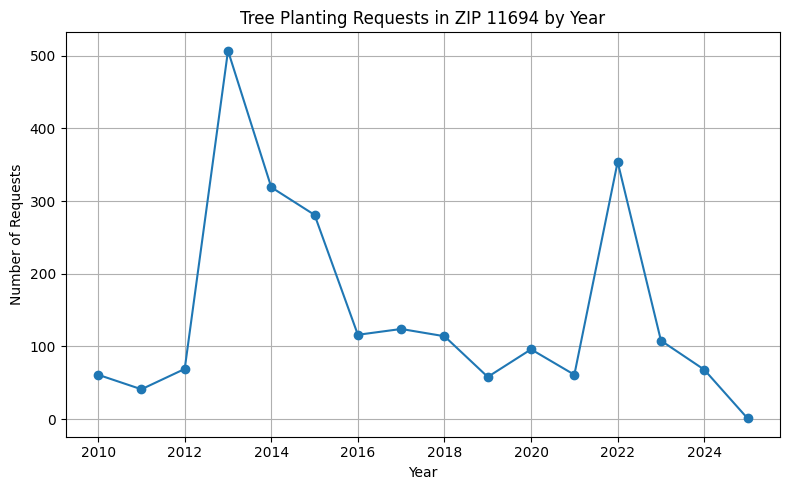

In [236]:
# Filter data for ZIP 11694, group by year, count requests
yearly_counts = plant_pop[plant_pop['incident_zip'] == '11694'].groupby('created_year').size()

# Plot with figure size and labels
plt.figure(figsize=(8, 5))
yearly_counts.plot(kind='line', marker='o')
plt.title('Tree Planting Requests in ZIP 11694 by Year')
plt.xlabel('Year')
plt.ylabel('Number of Requests')
plt.grid(True)
plt.tight_layout()
plt.show()

In [245]:
plant_pop[plant_pop['incident_zip'] == '10020'].groupby('created_year').size()

created_year
2014    4
2020    1
2024    1
dtype: int64

## Merging in zip code population data with 311 tree planting requests data

In [195]:
damaged_tree_pop = df.merge(pop, left_on='incident_zip', right_on='name', how='left')

In [196]:
damaged_tree_pop['population'] = damaged_tree_pop['B01003001']

In [197]:
damaged_tree_pop = damaged_tree_pop.drop(columns={'B01003001','B01003001, Error'})

In [199]:
# First, group by ZIP and aggregate both count and population
zip_stats_damaged_tree = damaged_tree_pop.groupby('incident_zip').agg({
    'unique_key': 'count',  # or any column that's always filled
    'population': 'first'   # assuming population is constant per ZIP
}).rename(columns={'unique_key': 'complaint_count'})

In [200]:
# Now calculate complaints per 1000 people
zip_stats_damaged_tree['complaints_per_1000'] = zip_stats_damaged_tree['complaint_count'] / zip_stats_damaged_tree['population'] * 1000

In [201]:
zip_stats_damaged_tree.head()

,complaint_count,population,complaints_per_1000
incident_zip,,,
00000,6,NaN,NaN
00083,5,NaN,NaN
1000,1,NaN,NaN
10000,33,NaN,NaN
10001,220,29079.0,7.565597


In [202]:
zip_stats_damaged_tree.to_csv('zip_damaged_tree_complaints_aggregates.csv')

In [203]:
%%R

df <- read.csv('zip_damaged_tree_complaints_aggregates.csv')

In [207]:
%%R

head(df)

  incident_zip complaint_count population complaints_per_1000
1        00000               6         NA                  NA
2        00083               5         NA                  NA
3         1000               1         NA                  NA
4        10000              33         NA                  NA
5        10001             220      29079            7.565597
6        10002             744      75517            9.852086


In [204]:
%%R

df$incident_zip <- as.character(df$incident_zip)

In [205]:
%%R

merged_df <- merge(df, ny_zips, by.x = "incident_zip", by.y = "ZCTA5CE20", all = TRUE)

In [206]:
%%R

merged_df <- st_as_sf(merged_df)


 

(`geom_text()`). 



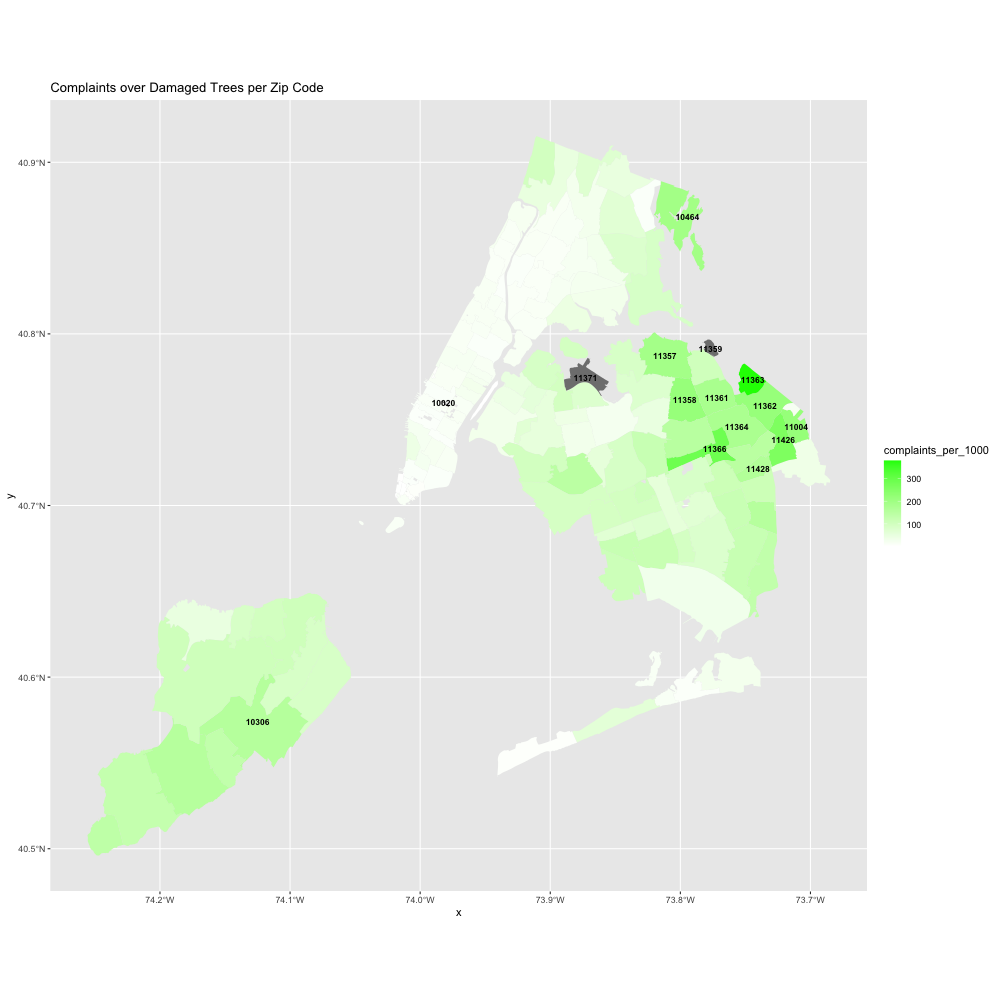

In [237]:
%%R -w 1000 -h 1000

# Identify top 20 ZIP codes by complaint rate
top20_labels <- merged_df %>%
  arrange(desc(complaints_per_1000)) %>%
  slice_head(n = 20)

# Plot with labels
merged_df %>%
  ggplot(aes(fill = complaints_per_1000)) + 
  geom_sf(color = NA) + 
  geom_sf_text(
    data = top20_labels,
    aes(label = incident_zip),  # Adjust if your ZIP column is named differently
    size = 3,
    color = "black",
    fontface = "bold"
  ) +
  scale_fill_gradient(low = "white", high = "green") + 
  labs(
    title = "Complaints over Damaged Trees per Zip Code"
    # subtitle = "Median Income by Census Tract, New York City",
    # caption = "Source: US Census Bureau"
  )

In [239]:
df.head()

,unique_key,created_date,agency,agency_name,complaint_type,descriptor,location_type,incident_zip,incident_address,street_name,cross_street_1,cross_street_2,intersection_street_1,intersection_street_2,address_type,city,landmark,status,community_board,bbl,borough,x_coordinate_state_plane,y_coordinate_state_plane,open_data_channel_type,park_facility_name,park_borough,latitude,longitude,location,resolution_description,resolution_action_updated_date,closed_date,due_date,facility_type,created_year
0,65257581,2025-06-13T22:42:04.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch Cracked and Will Fall,Street,11379,61-42 62 AVENUE,62 AVENUE,FRESH POND ROAD,62 STREET,FRESH POND ROAD,62 STREET,ADDRESS,MIDDLE VILLAGE,62 AVENUE,In Progress,05 QUEENS,4027680016,QUEENS,1011814,199381,ONLINE,Unspecified,QUEENS,40.713888592733305,-73.90057102178991,"{'latitude': '40.713888592733305', 'longitude'...",NaN,NaN,NaN,NaN,NaN,2025
1,65256313,2025-06-13T22:22:05.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11355,153-02 60 AVENUE,60 AVENUE,153 STREET,KISSENA BOULEVARD,153 STREET,KISSENA BOULEVARD,ADDRESS,FLUSHING,60 AVENUE,In Progress,07 QUEENS,4064410001,QUEENS,1034980,209120,ONLINE,Unspecified,QUEENS,40.740517214899235,-73.81693329744472,"{'latitude': '40.740517214899235', 'longitude'...",NaN,NaN,NaN,NaN,NaN,2025
2,65261404,2025-06-13T20:23:16.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Leaning/Uprooted,Street,11225,1035 WASHINGTON AVENUE,WASHINGTON AVENUE,FRANKLIN AVENUE SHUTTLE LINE,SULLIVAN PLACE,FRANKLIN AVENUE SHUTTLE LINE,SULLIVAN PLACE,ADDRESS,BROOKLYN,WASHINGTON AVENUE,In Progress,09 BROOKLYN,3011920085,BROOKLYN,995033,181278,MOBILE,Unspecified,BROOKLYN,40.664236392355235,-73.96113247695172,"{'latitude': '40.664236392355235', 'longitude'...",NaN,NaN,NaN,NaN,NaN,2025
3,65258779,2025-06-13T19:52:40.000,DPR,Department of Parks and Recreation,Damaged Tree,Branch or Limb Has Fallen Down,Street,11412,193-01 119 AVENUE,119 AVENUE,193 STREET,194 STREET,193 STREET,194 STREET,ADDRESS,SAINT ALBANS,119 AVENUE,In Progress,12 QUEENS,NaN,QUEENS,1051599,190712,PHONE,Unspecified,QUEENS,40.689880908148524,-73.75714561371204,"{'latitude': '40.689880908148524', 'longitude'...",NaN,NaN,NaN,NaN,NaN,2025
4,65260119,2025-06-13T19:51:41.000,DPR,Department of Parks and Recreation,Damaged Tree,Tree Leaning/Uprooted,Street,10024,104 RIVERSIDE DRIVE,RIVERSIDE DRIVE,WEST 82 STREET,WEST 83 STREET,WEST 82 STREET,WEST 83 STREET,ADDRESS,NEW YORK,RIVERSIDE DRIVE,In Progress,07 MANHATTAN,1012450046,MANHATTAN,989463,226113,MOBILE,Unspecified,MANHATTAN,40.78730257650706,-73.98117491358283,"{'latitude': '40.78730257650706', 'longitude':...",NaN,NaN,NaN,NaN,NaN,2025


In [238]:
df[df['incident_zip'] == '11363'].groupby('created_year').size()

created_year
2010    307
2011    158
2012    341
2013    105
2014    105
2015     97
2016    124
2017    126
2018    209
2019    154
2020    583
2021    127
2022    134
2023    117
2024    125
2025     30
dtype: int64

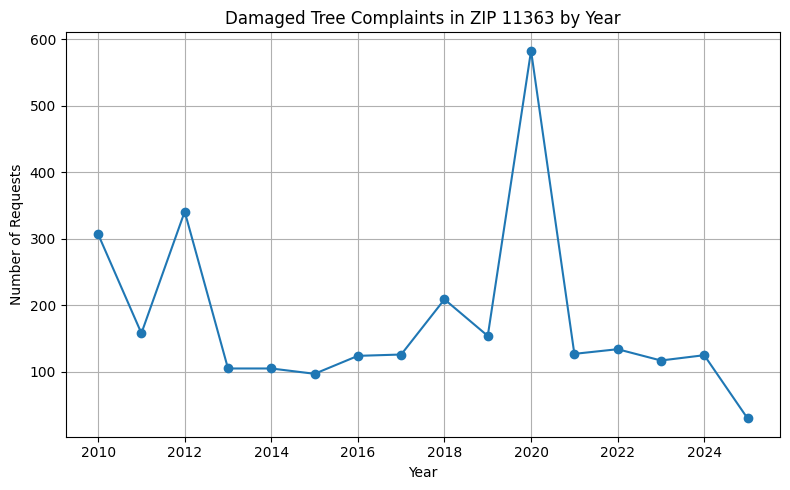

In [241]:
# Filter data for ZIP 11363, group by year, count requests
yearly_counts = df[df['incident_zip'] == '11363'].groupby('created_year').size()

# Plot with figure size and labels
plt.figure(figsize=(8, 5))
yearly_counts.plot(kind='line', marker='o')
plt.title('Damaged Tree Complaints in ZIP 11363 by Year')
plt.xlabel('Year')
plt.ylabel('Number of Requests')
plt.grid(True)
plt.tight_layout()
plt.show()

In [242]:
df[df['incident_zip'] == '11366'].groupby('created_year').size()

created_year
2010    359
2011    246
2012    637
2013    113
2014    104
2015    125
2016    175
2017    242
2018    333
2019    235
2020    484
2021    143
2022    125
2023    135
2024    191
2025     68
dtype: int64

In [243]:
df[df['incident_zip'] == '10464'].groupby('created_year').size()

created_year
2010     54
2011     44
2012     61
2013     38
2014     40
2015     20
2016     36
2017     39
2018     94
2019     38
2020    111
2021     65
2022     49
2023     53
2024     69
2025     16
dtype: int64